### Importação dos dados



In [53]:
import pandas as pd

url = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_1.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science/refs/heads/main/base-de-dados-challenge-1/loja_4.csv"

loja = pd.read_csv(url)
loja2 = pd.read_csv(url2)
loja3 = pd.read_csv(url3)
loja4 = pd.read_csv(url4)

loja.head()

,Produto,Categoria do Produto,Preço,Frete,Data da Compra,Vendedor,Local da compra,Avaliação da compra,Tipo de pagamento,Quantidade de parcelas,lat,lon
0,Assistente virtual,eletronicos,219.08,9.249790,16/01/2021,Pedro Gomes,SP,4,cartao_credito,8,-22.19,-48.79
1,Mesa de jantar,moveis,256.35,11.234305,18/05/2022,Beatriz Moraes,RJ,1,cartao_credito,4,-22.25,-42.66
2,Jogo de tabuleiro,brinquedos,279.51,21.262681,15/03/2021,João Souza,DF,1,cartao_credito,1,-15.83,-47.86
3,Micro-ondas,eletrodomesticos,1009.99,54.667344,03/05/2022,João Souza,RS,4,boleto,1,-30.17,-53.50
4,Cadeira de escritório,moveis,446.99,26.964689,07/11/2020,Larissa Alves,MG,5,boleto,1,-18.10,-44.38


#1. Análise do faturamento


In [54]:
# Calculate the sum of prices for each store individually
soma_loja1 = loja['Preço'].sum()
soma_loja2 = loja2['Preço'].sum()
soma_loja3 = loja3['Preço'].sum()
soma_loja4 = loja4['Preço'].sum()

# Print the sum of prices for each store with clear formatting
print(f"Soma dos preços da Loja 1: R${soma_loja1:.2f}")
print(f"Soma dos preços da Loja 2: R${soma_loja2:.2f}")
print(f"Soma dos preços da Loja 3: R${soma_loja3:.2f}")
print(f"Soma dos preços da Loja 4: R${soma_loja4:.2f}")

# Calculate the total sum of prices across all stores (if needed again)
soma_total = soma_loja1 + soma_loja2 + soma_loja3 + soma_loja4
print(f"Soma total dos preços de todas as lojas: R${soma_total:.2f}")

Soma dos preços da Loja 1: R$1534509.12
Soma dos preços da Loja 2: R$1488459.06
Soma dos preços da Loja 3: R$1464025.03
Soma dos preços da Loja 4: R$1384497.58
Soma total dos preços de todas as lojas: R$5871490.79


In [55]:

import locale

try:
  locale.setlocale(locale.LC_ALL, 'pt_BR.UTF-8')
except locale.Error:
  print("Warning: Could not set locale for currency formatting. Falling back to default.")
  locale.setlocale(locale.LC_ALL, '')

# Print the sum of prices for each store with currency formatting
print(f"Soma dos preços da Loja 1: {locale.currency(soma_loja1, grouping=True)}")
print(f"Soma dos preços da Loja 2: {locale.currency(soma_loja2, grouping=True)}")
print(f"Soma dos preços da Loja 3: {locale.currency(soma_loja3, grouping=True)}")
print(f"Soma dos preços da Loja 4: {locale.currency(soma_loja4, grouping=True)}")

# Calculate the total sum of prices across all stores (if needed again)
soma_total = soma_loja1 + soma_loja2 + soma_loja3 + soma_loja4
print(f"Soma total dos preços de todas as lojas: {locale.currency(soma_total, grouping=True)}")

Soma dos preços da Loja 1: $1,534,509.12
Soma dos preços da Loja 2: $1,488,459.06
Soma dos preços da Loja 3: $1,464,025.03
Soma dos preços da Loja 4: $1,384,497.58
Soma total dos preços de todas as lojas: $5,871,490.79


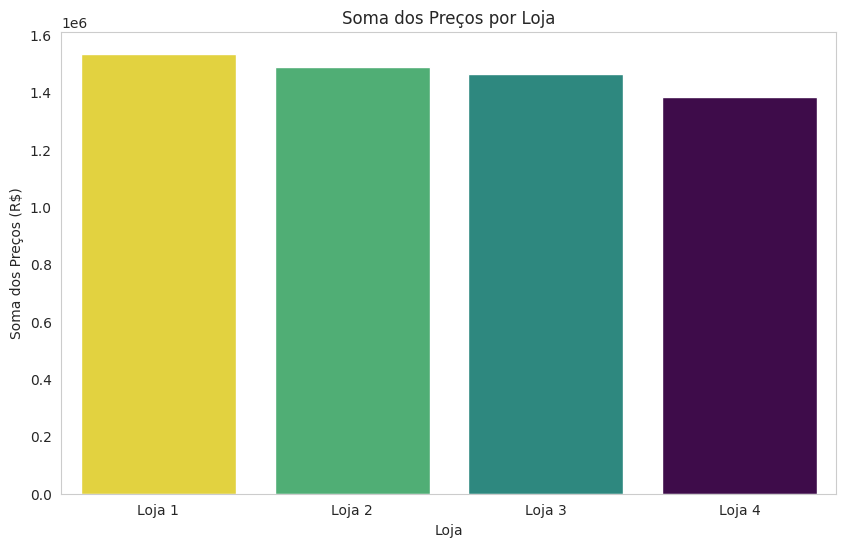

In [56]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create a DataFrame to store the sum of prices for each store
sum_prices_df = pd.DataFrame({
    'Loja': ['Loja 1', 'Loja 2', 'Loja 3', 'Loja 4'],
    'Soma dos Preços': [soma_loja1, soma_loja2, soma_loja3, soma_loja4]
})

# Set the style for the plots
sns.set_style("whitegrid")

# Create a bar plot to visualize the sum of prices per store
plt.figure(figsize=(10, 6))
sns.barplot(x='Loja', y='Soma dos Preços', data=sum_prices_df, palette='viridis', hue="Soma dos Preços" , legend=False)
plt.title('Soma dos Preços por Loja')
plt.xlabel('Loja')
plt.ylabel('Soma dos Preços (R$)')
plt.grid(axis='y')
plt.show()


# 2. Vendas por Categoria


In [57]:
# Função para analisar vendas por categoria em uma loja
def analisar_vendas_por_categoria(df, nome_loja):
    vendas_por_categoria = df.groupby('Categoria do Produto')['Produto'].count().reset_index()
    vendas_por_categoria = vendas_por_categoria.rename(columns={'Produto': 'Quantidade Vendida'})
    vendas_por_categoria = vendas_por_categoria.sort_values(by='Quantidade Vendida', ascending=False)
    print(f"\nQuantidade de produtos vendidos por categoria na {nome_loja}:")
    print(vendas_por_categoria)
    return vendas_por_categoria

# Analisar vendas por categoria para cada loja
vendas_loja1 = analisar_vendas_por_categoria(loja, "Loja 1")
vendas_loja2 = analisar_vendas_por_categoria(loja2, "Loja 2")
vendas_loja3 = analisar_vendas_por_categoria(loja3, "Loja 3")
vendas_loja4 = analisar_vendas_por_categoria(loja4, "Loja 4")


Quantidade de produtos vendidos por categoria na Loja 1:
    Categoria do Produto  Quantidade Vendida
6                 moveis                 465
2            eletronicos                 448
0             brinquedos                 324
1       eletrodomesticos                 312
3        esporte e lazer                 284
4  instrumentos musicais                 182
5                 livros                 173
7  utilidades domesticas                 171

Quantidade de produtos vendidos por categoria na Loja 2:
    Categoria do Produto  Quantidade Vendida
6                 moveis                 442
2            eletronicos                 422
0             brinquedos                 313
1       eletrodomesticos                 305
3        esporte e lazer                 275
4  instrumentos musicais                 224
5                 livros                 197
7  utilidades domesticas                 181

Quantidade de produtos vendidos por categoria na Loja 3:
    Categoria do

# 3. Média de Avaliação das Lojas

In [58]:
# Calculate the average rating for each store
media_avaliacao_loja1 = loja['Avaliação da compra'].mean()
media_avaliacao_loja2 = loja2['Avaliação da compra'].mean()
media_avaliacao_loja3 = loja3['Avaliação da compra'].mean()
media_avaliacao_loja4 = loja4['Avaliação da compra'].mean()

# Print the average rating for each store
print(f"Média de avaliação da Loja 1: {media_avaliacao_loja1:.2f}")
print(f"Média de avaliação da Loja 2: {media_avaliacao_loja2:.2f}")
print(f"Média de avaliação da Loja 3: {media_avaliacao_loja3:.2f}")
print(f"Média de avaliação da Loja 4: {media_avaliacao_loja4:.2f}")

Média de avaliação da Loja 1: 3.98
Média de avaliação da Loja 2: 4.04
Média de avaliação da Loja 3: 4.05
Média de avaliação da Loja 4: 4.00


# 4. Produtos Mais e Menos Vendidos


--- Produtos Mais Vendidos na Loja 1 ---
               Produto  Quantidade Vendida
47       TV Led UHD 4K                  60
37         Micro-ondas                  60
24       Guarda roupas                  60
43  Secadora de roupas                  58
3     Blocos de montar                  56

--- Produtos Menos Vendidos na Loja 1 ---
                        Produto  Quantidade Vendida
13  Ciência de dados com python                  39
40                     Pandeiro                  36
41            Panela de pressão                  35
11                 Celular ABXY                  33
26                      Headset                  33


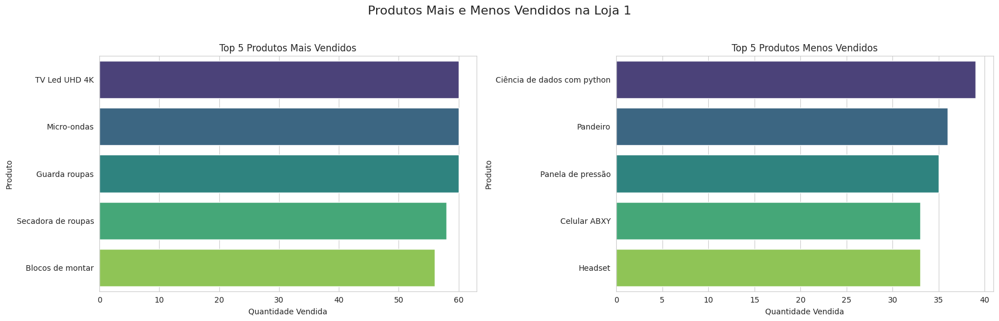


--- Produtos Mais Vendidos na Loja 2 ---
                     Produto  Quantidade Vendida
28  Iniciando em programação                  65
37               Micro-ondas                  62
1                    Bateria                  61
49                    Violão                  58
40                  Pandeiro                  58

--- Produtos Menos Vendidos na Loja 2 ---
              Produto  Quantidade Vendida
22     Fone de ouvido                  37
42           Poltrona                  35
27         Impressora                  34
36     Mesa de jantar                  34
31  Jogo de tabuleiro                  32


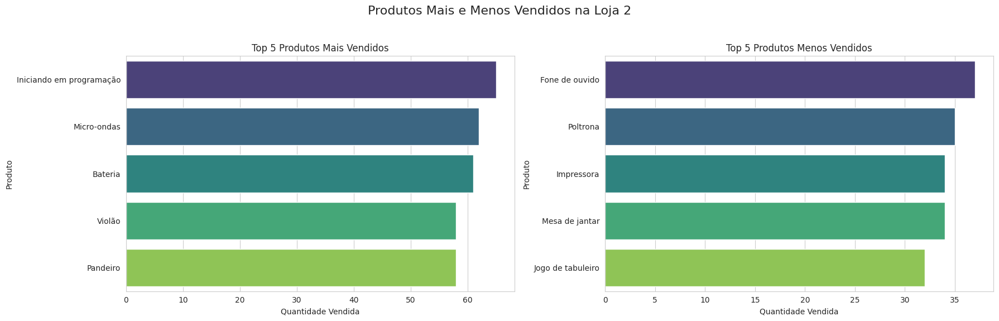


--- Produtos Mais Vendidos na Loja 3 ---
            Produto  Quantidade Vendida
32    Kit banquetas                  57
36   Mesa de jantar                  56
9         Cama king                  56
17           Cômoda                  55
30  Jogo de panelas                  55

--- Produtos Menos Vendidos na Loja 3 ---
             Produto  Quantidade Vendida
14      Copo térmico                  38
37       Micro-ondas                  36
29     Jogo de copos                  36
38           Mochila                  36
3   Blocos de montar                  35


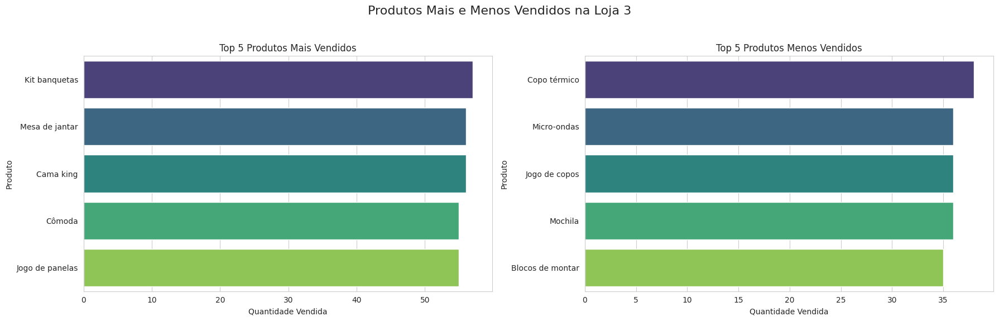


--- Produtos Mais Vendidos na Loja 4 ---
                    Produto  Quantidade Vendida
8                  Cama box                  62
20                 Faqueiro                  59
9                 Cama king                  56
18  Dashboards com Power BI                  56
17                   Cômoda                  55

--- Produtos Menos Vendidos na Loja 4 ---
               Produto  Quantidade Vendida
23           Geladeira                  38
34  Lavadora de roupas                  38
49              Violão                  37
24       Guarda roupas                  34
25            Guitarra                  33


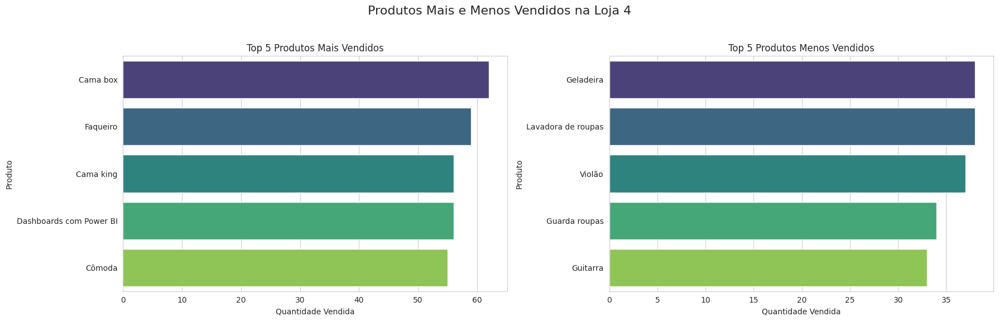

In [59]:
import matplotlib.pyplot as plt
import seaborn as sns

def analisar_produtos_mais_menos_vendidos(df, nome_loja):
  """
  Identifica os produtos mais e menos vendidos em um DataFrame de vendas.

  Args:
    df (pd.DataFrame): DataFrame contendo os dados de vendas.
    nome_loja (str): Nome da loja para identificação.

  Returns:
    tuple: Uma tupla contendo dois DataFrames:
           - Top 5 produtos mais vendidos.
           - Top 5 produtos menos vendidos.
  """
  vendas_por_produto = df.groupby('Produto')['Produto'].count().reset_index(name='Quantidade Vendida')
  vendas_por_produto = vendas_por_produto.sort_values(by='Quantidade Vendida', ascending=False)

  mais_vendidos = vendas_por_produto.head(5)
  menos_vendidos = vendas_por_produto.tail(5)

  print(f"\n--- Produtos Mais Vendidos na {nome_loja} ---")
  print(mais_vendidos)

  print(f"\n--- Produtos Menos Vendidos na {nome_loja} ---")
  print(menos_vendidos)

  # Visualização dos resultados
  fig, axes = plt.subplots(1, 2, figsize=(18, 6))
  fig.suptitle(f'Produtos Mais e Menos Vendidos na {nome_loja}', fontsize=16)

  # Gráfico de barras para os mais vendidos
  sns.barplot(x='Quantidade Vendida', y='Produto', data=mais_vendidos, ax=axes[0], palette='viridis', hue='Produto', legend=False)
  axes[0].set_title('Top 5 Produtos Mais Vendidos')
  axes[0].set_xlabel('Quantidade Vendida')
  axes[0].set_ylabel('Produto')

  # Gráfico de barras para os menos vendidos
  sns.barplot(x='Quantidade Vendida', y='Produto', data=menos_vendidos, ax=axes[1], palette='viridis', hue='Produto', legend=False)
  axes[1].set_title('Top 5 Produtos Menos Vendidos')
  axes[1].set_xlabel('Quantidade Vendida')
  axes[1].set_ylabel('Produto')

  plt.tight_layout(rect=[0, 0.03, 1, 0.95])
  plt.show()


  return mais_vendidos, menos_vendidos

# Analisar produtos mais e menos vendidos para cada loja
mais_menos_loja1 = analisar_produtos_mais_menos_vendidos(loja, "Loja 1")
mais_menos_loja2 = analisar_produtos_mais_menos_vendidos(loja2, "Loja 2")
mais_menos_loja3 = analisar_produtos_mais_menos_vendidos(loja3, "Loja 3")
mais_menos_loja4 = analisar_produtos_mais_menos_vendidos(loja4, "Loja 4")


# 5. Frete Médio por Loja


In [60]:
# Calculate the average shipping cost for each store
media_frete_loja1 = loja['Frete'].mean()
media_frete_loja2 = loja2['Frete'].mean()
media_frete_loja3 = loja3['Frete'].mean()
media_frete_loja4 = loja4['Frete'].mean()

# Print the average shipping cost for each store
print(f"Custo médio de frete da Loja 1: R${media_frete_loja1:.2f}")
print(f"Custo médio de frete da Loja 2: R${media_frete_loja2:.2f}")
print(f"Custo médio de frete da Loja 3: R${media_frete_loja3:.2f}")
print(f"Custo médio de frete da Loja 4: R${media_frete_loja4:.2f}")


Custo médio de frete da Loja 1: R$34.69
Custo médio de frete da Loja 2: R$33.62
Custo médio de frete da Loja 3: R$33.07
Custo médio de frete da Loja 4: R$31.28


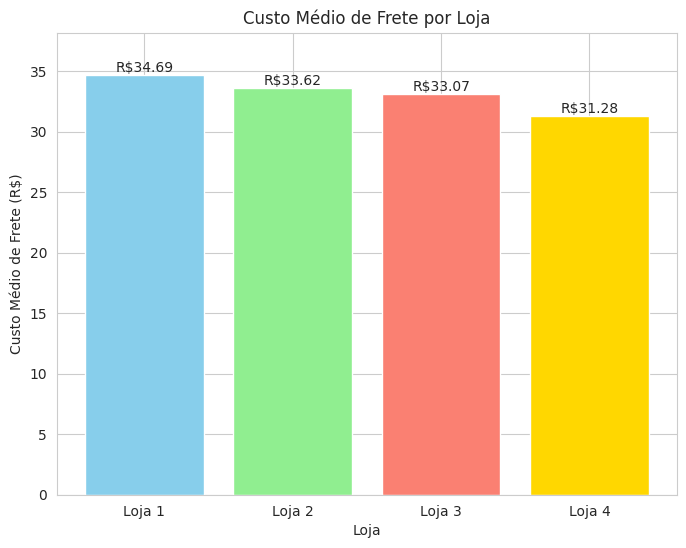

In [61]:
# Gráficos para a média de frete por loja

# Data for the average shipping cost
lojas = ['Loja 1', 'Loja 2', 'Loja 3', 'Loja 4']
custo_medio_frete = [media_frete_loja1, media_frete_loja2, media_frete_loja3, media_frete_loja4]

# Create the bar chart
plt.figure(figsize=(8, 6))
bars = plt.bar(lojas, custo_medio_frete, color=['skyblue', 'lightgreen', 'salmon', 'gold'])
plt.xlabel('Loja')
plt.ylabel('Custo Médio de Frete (R$)')
plt.title('Custo Médio de Frete por Loja')
plt.ylim(0, max(custo_medio_frete) * 1.1) # Adjust y-axis limit

# Add values on top of the bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2.0, yval, f'R${yval:.2f}', va='bottom', ha='center') # va: vertical alignment, ha: horizontal alignment

plt.show()

As lojas 2 e 3, são as lojas com as melhores avaliações de clientes, altas médias de faturamento, então eu nao consideraria para a venda, nos restando a loja 1 e 4 para comparação.
Eu recomendo a venda da loja 4, embasando nos fatores em que o faturamento é o mais baixo, apesar da média de avaliações nao ser a menor e o custo médio de frete ser o mais baixo, a diferença de faturamento para com a loja 1, se justifica o mantimento da loja 1 e procurar maneiras de baratear a média do custo de frete de uma forma eficaz, a avaliação de clientes nao teria um grande impacto nessa decisão visto que a diferença entre essas duas lojas estão na casa de centesimos de diferença, 0,04 para ser preciso, a venda da loja 4 seria a melhor decisão no atual cenário.

# 6. EXTRA


In [63]:
import folium

# Combine dataframes for easier plotting
all_stores = pd.concat([loja.assign(Loja='Loja 1'),
                        loja2.assign(Loja='Loja 2'),
                        loja3.assign(Loja='Loja 3'),
                        loja4.assign(Loja='Loja 4')])

# Create a base map
m = folium.Map(location=[all_stores['lat'].mean(), all_stores['lon'].mean()], zoom_start=10)

# Add markers for each sale, colored by store
for index, row in all_stores.iterrows():
    color = {
        'Loja 1': 'blue',
        'Loja 2': 'green',
        'Loja 3': 'purple',
        'Loja 4': 'orange'
    }[row['Loja']]
    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=5,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.6,
        tooltip=f"Loja: {row['Loja']}<br>Produto: {row['Produto']}<br>Preço: R${row['Preço']:.2f}"
    ).add_to(m)

# Display the map
m